In [1]:
import pandas as pd
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', 100)

# To remove pandas copy warnings (may need to turn on if writing new functions):
import warnings
warnings.filterwarnings('ignore')

import numpy as np
from Bio.PDB import *
import community
import networkx as nx
import igraph as ig
import matplotlib.pyplot as plt
from sklearn.metrics.cluster import normalized_mutual_info_score
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
%matplotlib inline
from IPython.display import Image

In [2]:
from IPython.display import HTML
HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

## Abstract
The ribosome is an extremely important molecular organelle for the cellular workings. It is of interest to a wide array of scientists with spanning interests from the fundamental questions of life and individuality to the practical fields of medicine development and pharmacology. Here we present network analysis on interactions between the ribosomal constituents – ribosomal RNA (rRNA) and ribosomal proteins (rProteins) in the context of the accretion model for ribosomal evolution [1]. We demonstrate that different evolutionary phases give deferring network statistics from one another, furthermore the ribosomal networks’characteristics are a result of their degree distributions when considering the ribosome as whole evolving entity. We also show that community detection algorithms can be used to define rRNA and rProtein folding domains, and show the interdependence between rRNA and rProtein interactions.

## Introduction 
### Origin of life 
The question of how life began on our planet has always been one of importance to scientists and people in general. From the ancient Greek philosophers and their rudimentary definitions of life, to the modern astrobiological community, humanity has always searched for answers to one of the most fundamental questions. Understanding how life began in our planet is the only example we can use to guide us in space exploration and the search of life outside of our planet and Solar system. Below is a short gif of the ribosome translating mRNA into protein.

<img src="./figs/ribo.gif">

### Ribosomes and the Origin of life 
Ribosomes have central role in the functions of cells and by extension organisms. They are the factories of functional units (proteins) and are present in every living cell as an important link between the informational storage systems (RNA/DNA) and the functional one (proteins). Given their central role it is not surprising that many of the genes related to ribosomes are essential. In recent work, our lab has demonstrated that structures of rRNA and rProteins hold information about evolutionary events that have occurred long before LUCA (last universal common ancestor) [2,3]. 

Below is an image from a recent paper of ours that depicts the evolution of rRNA and rProtein [3]. In panel A, the rProtein is shown in grey and the rRNA is colored by evolutionary age; phase1 is the oldest evolutionary phase and is colored in dark blue, phase2 in light blue, phase3 in green, phase4 in yellow, phase5 in orange, and phase6 in red are sequentially more recent with phase6 being the most recent phase. In panel B, the rRNA is omitted with a contour line showing its shape. rProteins that are homologous to all 3 domains of life are colored by which phase of rRNA evolution they most favorable interact with. Bacterial-specific rProteins are colored in grey since they were not analyzed in the paper. Panel B shows that the segments of rProteins that are closest to the center of the ribosome, which is the oldest part of the ribosome, do not have any strucutre, while the segments of rProteins closes to the surface of the ribosome, which is the most recent portion of the ribsome, form globular domains characteristic of proteins found elsewhere in the cell.

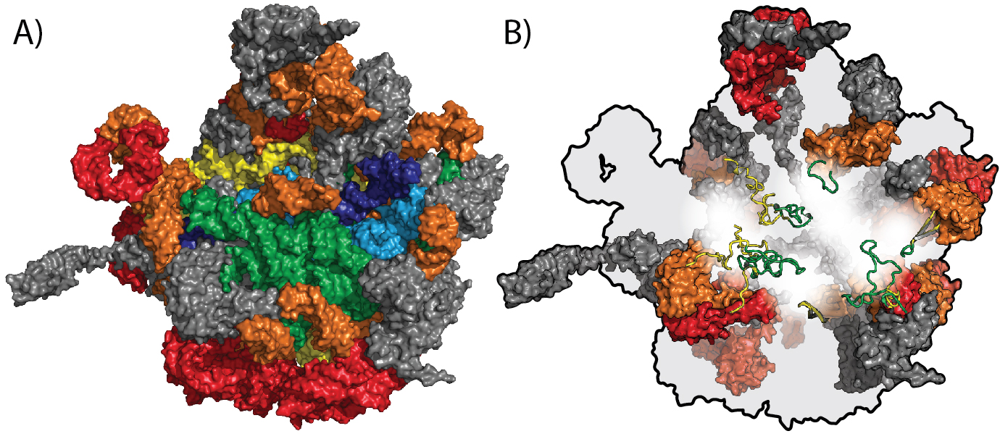

In [3]:
Image('./figs/Figure_1_A+B_rRNA+rProtein_Evolution-01.jpg')

### Ribosome Evolution and Networks 
The ribosome is a huge molecular complex that involves at least 50 different proteins and 3 long RNA chains, organized in a highly processive enzyme that allows the creation of the peptide bond between amino-acids. During the process of translation, the structure of the ribosome undergoes major topological accommodations and changes to receive incoming loaded tRNAs and to release outgoing empty ones. As such the ribosome has proven to be an extremely complex organelle for analysis. Using the network analysis toolset can give us leverage against this information rich problem. This has been done in other labs as a proof of concept for a tool under development [4] and also with the explicit purpose of exploring protein-protein interactions within the ribosomal structure [5]. However, these analyses do not take into consideration the evolutionary history of the ribosome and the fact that certain parts of it are more ancient and of greater importance than others. We believe that applying the classical toolset from network analysis on our evolutionary model will provide information about the way biology emerged from a purely chemical world. 

### Timing of the ribosomal evolution 
Petrov et.al. [1] distinguishes 6 separate evolutionary phases in the bacterial ribosomes. Starting from the earliest Phases 1 and 2, which organized the PTC (peptidyl transferase center), moving through phases 3 and 4 which distinguished the exit canal and created the SSU (small subunit) interface, and finally reaching phase 5 that gave processive ability to the ribosome by defining the stalks and central protuberance. Finally phase 6 shows the divergence between bacteria and archaea. During each phase the rProteins present demonstrate increasingly more complex structures starting from unstructured loops in phase 3, simple secondary elements in phase 4, small globular β-barrel like domains in phase 5, and finally  combining  α and β secondary elements in complex multi-domain proteins at phase 6 [3]. Applying network analysis on each phase will show the inherent differences in the connectivity and the way they grew out of the already present ones.

## Results
We present an analysis of the interaction network of the bacterial ribosome. The ribosome is a molecular fossil that contains with its sequence and strucutre the evolution of life. Here we show that the interactions within the ribosome further resolves the evolution of life.

We use two programs to calculate the interactions within the bacterial ribosome. Arpeggio is written in python using open-source packages and was written to analyze protein-protein, protein-RNA, and protein-DNA interactions [6]. Ring2.0 is written in C and was written to ease the analysis of macromolecular networks at the residue level [7]. The two programs were used to calculate the atomic interactions within the ribosome of the bacteria Escherichia coli. We are not concerned with covalent interactions in our analysis of the interaction network of the bacterial ribosome in this study. 

### Community Network Analysis of the Bacterial Ribosome
Ring2.0 was used to retrieve the interactions network of the bacterial ribosome which was then used to find communities with the ribosome. Below is the defintions of the 6 atomic interactions that Ring2.0 calculates [7].

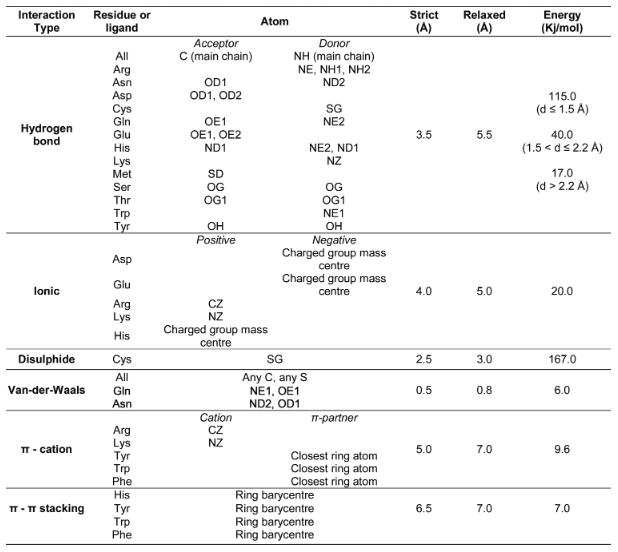

In [4]:
Image('./figs/RING_energy_dist.png')

Ring2.0 gives 3 output files that we then used to analyze the bacterial ribosome: an edge file of the network, a node file of the network, and an xml that contains the whole network. The next two cells show the edge file and node file, respectively. The node file was then  modified using biopython to add the x, y, and z coordinates of the metals and RNA, since Ring2.0 did not retrieve this data correctly. We also labeled the residues in the node file by which  Ribosomal Protein (rProtein) or evoluationary phase of Ribosomal RNA (rRNA) they belonged.

In [5]:
EsCo_edges = pd.read_csv('../../Ring_Analysis/4v9d_phase_as_chains/4v9d_phase_as_chains_edges.txt', sep='\t')
EsCo_edges

,NodeId1,Interaction,NodeId2,Distance,Angle,Energy,Atom1,Atom2,Donor,Positive,Cation,Orientation
0,0:3:_:GLN,VDW:SC_SC,0:7:_:PRO,3.427,-999.900,6.0,NE2,CD,NaN,NaN,NaN,NaN
1,0:8:_:THR,HBOND:SC_MC,0:11:_:LYS,2.954,17.792,17.0,OG1,N,0:11:_:LYS,NaN,NaN,NaN
2,0:8:_:THR,HBOND:MC_MC,0:12:_:ARG,3.046,7.256,17.0,O,N,0:12:_:ARG,NaN,NaN,NaN
3,0:9:_:ARG,VDW:SC_SC,0:12:_:ARG,3.839,-999.900,6.0,CB,CZ,NaN,NaN,NaN,NaN
4,0:9:_:ARG,HBOND:MC_MC,0:13:_:GLY,3.303,9.562,17.0,O,N,0:13:_:GLY,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
49700,z:2496:_:C,IAC:LIG_LIG,z:3071:_:MG,4.549,-999.900,0.0,N4,MG,NaN,NaN,NaN,NaN
49701,z:2497:_:A,IAC:LIG_LIG,z:2500:_:U,6.587,-999.900,0.0,N3,O4,NaN,NaN,NaN,NaN
49702,z:2497:_:A,IAC:LIG_LIG,z:3071:_:MG,4.471,-999.900,0.0,N1,MG,NaN,NaN,NaN,NaN
49703,z:2498:_:C,IAC:LIG_LIG,z:3071:_:MG,6.112,-999.900,0.0,N4,MG,NaN,NaN,NaN,NaN


In [6]:
temp_EsCo_nodes = pd.read_csv('../../Ring_Analysis/4v9d_phase_as_chains/4v9d_phase_as_chains_nodes.txt', sep='\t').drop(['pdbFileName'], axis=1)

In [7]:
parser = PDBParser(QUIET=True)
EsCo_PDB = parser.get_structure('EsCo_PDB', '../../Ring_Analysis/4v9d_phase_as_chains/4v9d_phase_as_chains.pdb')

In [8]:
# rewrite to clean up the look
def make_PDB_df(parsed_structure):
    """
    Create BioPython dataframe of atom properties 
    """
    structure_list = []
    for atom in Selection.unfold_entities(parsed_structure, 'A'):
        atom_name = str(atom.id)
        if atom_name == 'CA':
            resnum = str(atom.get_parent().id[1])
            resname = str(atom.get_parent().resname)
            if atom.get_parent().id[2] == ' ':
                insertion_code = '_'
            else:
                insertion_code = atom.get_parent().id[2]
            chain = str(atom.get_parent().get_parent().id)
            nodeid = chain+':'+resnum+':'+insertion_code+':'+resname
            structure_list.append([nodeid, atom.coord[0], atom.coord[1], atom.coord[2]])
        if  atom_name == "C5'" or atom_name == 'K':
            resnum = str(atom.get_parent().id[1])
            resname = str(atom.get_parent().resname)
            if atom.get_parent().id[2] == ' ':
                insertion_code = '_'
            else:
                insertion_code = atom.get_parent().id[2]
            chain = str(atom.get_parent().get_parent().id)
            nodeid = chain+':'+resnum+':'+insertion_code+':'+resname[2:]
            structure_list.append([nodeid, atom.coord[0], atom.coord[1], atom.coord[2]])
        if atom_name == 'MG' or atom_name == 'ZN':
            resnum = str(atom.get_parent().id[1])
            resname = str(atom.get_parent().resname)
            if atom.get_parent().id[2] == ' ':
                insertion_code = '_'
            else:
                insertion_code = atom.get_parent().id[2]
            chain = str(atom.get_parent().get_parent().id)
            nodeid = chain+':'+resnum+':'+insertion_code+':'+resname[1:]
            structure_list.append([nodeid, atom.coord[0], atom.coord[1], atom.coord[2]]) 
    structure_df = pd.DataFrame(structure_list, columns=['NodeId', 'x_new', 'y_new', 'z_new'])
    return(structure_df)

In [9]:
EsCo_df = make_PDB_df(EsCo_PDB)

In [10]:
EsCo_nodes = pd.merge(temp_EsCo_nodes, EsCo_df, on='NodeId', how='inner')
EsCo_nodes = EsCo_nodes.drop(['x', 'y', 'z'], axis=1)
EsCo_nodes = EsCo_nodes.rename(columns={'x_new':'x', 'y_new':'y', 'z_new':'z'})

In [11]:
name_chains = pd.read_csv('../../Ring_Analysis/4v9d_phase_as_chains/4v9d_name_chains.csv', names=['Object', 'Chain'])
EsCo_nodes = pd.merge(EsCo_nodes, name_chains, on='Chain')
EsCo_nodes

,NodeId,Chain,Position,Residue,Dssp,Degree,Bfactor_CA,Rapdf,Tap,Accessibility,x,y,z,Object
0,z:1402:Z:C,z,1402,C,NaN,16,-999.90,-999.900,-999.900,-999.900,-98.388000,25.709000,-15.153000,Phase1
1,z:1403:Z:C,z,1403,C,NaN,12,-999.90,-999.900,-999.900,-999.900,-92.976997,22.837000,-14.876000,Phase1
2,z:1404:Z:C,z,1404,C,NaN,10,-999.90,-999.900,-999.900,-999.900,-88.810997,18.989000,-12.866000,Phase1
3,z:1405:Z:G,z,1405,G,NaN,12,-999.90,-999.900,-999.900,-999.900,-86.110001,13.792000,-11.342000,Phase1
4,z:1406:Z:U,z,1406,U,NaN,13,-999.90,-999.900,-999.900,-999.900,-85.891998,7.446000,-10.625000,Phase1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10511,4:35:_:GLN,4,35,GLN,E,7,0.01,37.257,-0.009,0.013,-108.461998,-66.489998,-43.130001,bL36
10512,4:36:_:ARG,4,36,ARG,E,16,0.01,44.565,-1.319,0.387,-106.526001,-68.943001,-40.921001,bL36
10513,4:37:_:GLN,4,37,GLN,,13,12.82,42.725,0.770,0.458,-106.081001,-70.386002,-37.396000,bL36
10514,4:38:_:GLY,4,38,GLY,,7,0.01,10.721,0.000,0.596,-109.782997,-70.748001,-36.787998,bL36


In [12]:
def plot_nodes(df):    
    
    data = []
    
    for rPro in set(df['Object']):
        
        rPro_df = df[df['Object'] == rPro]
        data.append(
        go.Scatter3d(
            x = rPro_df['x'],
            y = rPro_df['y'],
            z = rPro_df['z'],
            text = 
                rPro_df['Residue']
                +' '+rPro_df['Dssp'],
            mode = 'markers',
            name = rPro
            )
        )

    layout = go.Layout(
        title = 'Thermus thermophilus Nodes (Atoms) Colored by rProtein and rRNA Phase',
        showlegend = True
    )

    fig = go.Figure(data=data, layout=layout)
    iplot(fig)

Here is a 3-dimensional plot of the ribosome strucuture colored by rProtein and rRNA phase.

In [13]:
plot_nodes(EsCo_nodes)

The plotting function can also be used to plot the nodes (residues) of rProtein or rRNA phase. Below are the nodes which belong to the universal rProtein uL4.

In [14]:
plot_nodes(EsCo_nodes[EsCo_nodes.Object == 'uL04'])

Only the node file was modified with the correct x,y,z coordinates and rProtein/rRNA phase information. The xml file was not, but that is not too much of a problem since we used the node file to create all figures in this report, while the xml file was used for the analysis. Here, we load the xml file into networkx. The network is a multigraph, meaning multiple edges can be between the same two nodes. This happens because each node is a resiude which is composed of atoms, and mutiple atoms can be involved between the interactions between two nodes.

In [15]:
G_EsCo = nx.read_graphml('../../Ring_Analysis/4v9d_phase_as_chains/4v9d_phase_as_chains_network.xml')

In [16]:
print('Number of nodes in xml file:', len(G_EsCo.nodes))

Number of nodes in xml file: 10561


In [17]:
print('Attributes of a node within the network:')
G_EsCo.nodes['n0']

Attributes of a node within the network:


{'Accessibility': -999.9,
 'Bfactor_CA': -999.9,
 'Degree': 16.0,
 'NodeId': 'z:1402:Z:C',
 'Position': 1402.0,
 'Rapdf': -999.9,
 'Residue': 'C',
 'Tap': -999.9,
 'name': 'z:1402:Z:C',
 'pdbFileName': '4v9d_phase_as_chains.pdb#1402.z',
 'x': -999.9,
 'y': -999.9,
 'z': -999.9}

In [18]:
print('Attributes of an edge within the network:')
G_EsCo.edges[('n0', 'n247', 0)]

Attributes of an edge within the network:


{'Angle': -999.9,
 'Atom1': "O2'",
 'Atom2': "O3'",
 'Cation': 'None',
 'Distance': 4.119,
 'Donor': 'None',
 'Energy': 0.0,
 'Interaction': 'IAC:LIG_LIG',
 'NodeId1': 'z:1402:Z:C',
 'NodeId2': '5:1394:Z:A',
 'Orientation': 'None',
 'Positive': 'None'}

We developed a function to detect communities within the graph using the louvain algorithm and then plot them in 3-dimensions with nodes colored by partition (optional).

In [19]:
def plot_louvain(res, G, make_plot=True):
    partition = community.best_partition(G, resolution=res, weight='Energy')
    partition_df = pd.DataFrame.from_dict(partition, orient='index').reset_index()
    partition_df.rename(columns={0:'partition'}, inplace=True)
    EsCo_partition = EsCo_nodes.join(partition_df)
    EsCo_partition = EsCo_partition.drop(['index'], axis=1)
    print('Resolution:', res)
    print('Number of partitions:',len(set(partition.values())))
    print('Modularity:', community.modularity(partition, G))
    if make_plot == True:
        plot_nodes_partitions(EsCo_partition)
        
    return(partition, EsCo_partition)

In [20]:
def plot_nodes_partitions(df):  
    
    data = []
    
    for partition_count in range(df['partition'].max()):
        
        partition_df = df[df['partition'] == partition_count]
        data.append(
        go.Scatter3d(
            x = partition_df['x'],
            y = partition_df['y'],
            z = partition_df['z'],
            text = 
                partition_df['Residue']
                +' '+partition_df['Dssp']
                +' '+partition_df['Chain']
                +' '+partition_df['Object'],
            mode = 'markers',
            name = 'partition'+str(partition_count)
            )
        )
        
    layout = go.Layout(
        title = 'Coloring ThTh rProteins and rRNA Phases by Community',
        showlegend = True
    )

    fig = go.Figure(data=data, layout=layout)
    iplot(fig)

In [21]:
louvain5, lv5_df = plot_louvain(5, G_EsCo, make_plot=True)

Resolution: 5
Number of partitions: 74
Modularity: 0.7958522770514428


In [22]:
louvain6, lv6_df = plot_louvain(6, G_EsCo, False)

Resolution: 6
Number of partitions: 74
Modularity: 0.7958522770514428


Using a resolution of 5 or 6 assignes every node to the exact same parition:

In [23]:
print('The normalized mutial information score between the partitions determined by a resolution of 5 and 6 in the louvain algorithm:')
normalized_mutual_info_score(list(louvain5.values()), list(louvain6.values()))

The normalized mutial information score between the partitions determined by a resolution of 5 and 6 in the louvain algorithm:


1.0

We then explore how the resolution changes the partitioning of the network. We did this by varying the resolution of the louvain algorithm to see how the partitions and modularity changed. Below, we have a graph showing how the number of partitions and modularity depend on the resolution of the louvain algorithm, and underneith the graph is a table that shows the partitioning of the first and last 5 nodes of the network.

In [24]:
resolution = np.linspace(1, 20, num=39, endpoint=True, retstep=False, dtype=None)

In [25]:
def make_prtn_mod_res_df(resolution_list, G):
    modularity_list = []
    partition_list = []
    nodes_partition_df = pd.DataFrame()
    
    for res in resolution:
        # Create dataframe to plot resolution vs. modularity and number of partitions
        partition = community.best_partition(G, resolution=res, weight='Energy')
        num_partitions = len(set(partition.values()))
        modularity = community.modularity(partition, G)
        modularity_list.append(modularity)
        partition_list.append(num_partitions)
        
        nx.set_node_attributes(G_EsCo, partition, 'louvain'+str(res))
        
        # Create dataframe to create table of nodes vs. partition number
        partition_df = pd.DataFrame.from_dict([partition]).T.reset_index()     
        partition_df = partition_df.rename(columns = {0:'louvain'+str(res), 'index':'node'})
        if nodes_partition_df.empty:
            nodes_partition_df = partition_df
        else:
            nodes_partition_df = pd.merge(nodes_partition_df, partition_df, on='node')
    
    df = pd.DataFrame(
        {'Resolution':resolution_list,
         'Num_Partitions':partition_list,
         'Modularity':modularity_list})
        
    return(df, nodes_partition_df)

In [26]:
prtn_mod_res_df, nodes_prtn_df = make_prtn_mod_res_df(resolution, G_EsCo)

# Create traces
trace0 = go.Scatter(
    x = prtn_mod_res_df['Resolution'],
    y = prtn_mod_res_df['Num_Partitions'],
    mode = 'lines',
    name = 'Partitions'
)
trace1 = go.Scatter(
    x = prtn_mod_res_df['Resolution'],
    y = prtn_mod_res_df['Modularity'],
    mode = 'lines',
    name = 'Modularity',
    yaxis='y2'
)


layout = go.Layout(
    title='Modularity and Parition Number vs. Louvain Resoution',
    xaxis=dict(
        title='Louvain Resolution'
    ),
    yaxis=dict(
        title='Number of Partitions'
    ),
    yaxis2=dict(
        title='Modularity',
        titlefont=dict(
            color='rgb(148, 103, 189)'
        ),
        tickfont=dict(
            color='rgb(148, 103, 189)'
        ),
        overlaying='y',
        side='right'
    )
)

data = [trace0, trace1]
fig = go.Figure(data=data, layout=layout)
iplot(fig)

nodes_prtn_df

,node,louvain1.0,louvain1.5,louvain2.0,louvain2.5,louvain3.0,louvain3.5,louvain4.0,louvain4.5,louvain5.0,louvain5.5,louvain6.0,louvain6.5,louvain7.0,louvain7.5,louvain8.0,louvain8.5,louvain9.0,louvain9.5,louvain10.0,louvain10.5,louvain11.0,louvain11.5,louvain12.0,louvain12.5,louvain13.0,louvain13.5,louvain14.0,louvain14.5,louvain15.0,louvain15.5,louvain16.0,louvain16.5,louvain17.0,louvain17.5,louvain18.0,louvain18.5,louvain19.0,louvain19.5,louvain20.0
0,n0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,n1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,n10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,n100,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
4,n1000,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10556,n9995,17,4,14,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
10557,n9996,17,4,14,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
10558,n9997,17,4,14,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
10559,n9998,17,4,14,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4


Based on this graph, we chose to analyze communities detected with the louvain algorithm with a resolution of 10, because the modularity was highest for the lowest number of partitions that was calculated.

In [27]:
louvain10, lv10_df = plot_louvain(10, G_EsCo, False)

Resolution: 10
Number of partitions: 73
Modularity: 0.7967781037787972


Here, we wrote a function to display an rProtein or rRNA phase with the lines connecting the nodes in the sequence of the macromolecule. This makes it easier for us to view the macromolecule and compare it to its structure in PyMOL. Below we have uL2 displayed with its nodes colored according to the community they belong. 

In [28]:
def plot_nodes_partitions(df, lines=True):  
    
    data = []
    
    for partition_count in range(df['partition'].max()):
        
        partition_df = df[df['partition'] == partition_count]
        partition_df.Position = partition_df.Position.astype(str)
        data.append(
            go.Scatter3d(
                x = partition_df['x'],
                y = partition_df['y'],
                z = partition_df['z'],
                text = 
                    partition_df['Residue']
                    +' '+partition_df['Position']
                    +' '+partition_df['Dssp']
                    +' '+partition_df['Chain']
                    +' '+partition_df['Object'],
                mode = 'markers',
                name = 'partition'+str(partition_count)
            )
        )
        
    layout = go.Layout(
        title = 'Coloring ThTh rProteins and rRNA Phases by Community',
        showlegend = True
    )

    if lines == True:
        data.append(
        go.Scatter3d(
            x = df['x'],
            y = df['y'],
            z = df['z'],
            mode = 'lines',
            hoverinfo='none'
            )
        )
    
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)

In [29]:
plot_nodes_partitions(lv10_df[lv10_df.Object == 'uL02'])

We can also use the plot_nodes function written earlier, to look at nodes belonging to a partition. Below, we plotted the nodes belonging to the largest partition found from the louvain algorithm with a resolution of 10. This partition has 640 nodes from multiple rProteins, mRNA, the tRNA located between the P-site and E-site, and all 6 phases of rRNA evolution.

In [30]:
plot_nodes(lv10_df[lv10_df.partition == 0])

Below is the result of community detection within phase1 of rRNA evolution:

In [31]:
plot_nodes_partitions(lv10_df[lv10_df.Object == 'Phase1'], lines=False)

We tried out some other community detection algorithms, but they perfomed very poorly as shown by their very low modularity and large number of partitions found. Below is our calculations from the walktrap algorithm. We also tried to implement the Girvan-Newman algorithm but the results took far too long to analyze and did not make sense.

In [32]:
ig_G = ig.Graph.Read_GraphML('../../Ring_Analysis/4v9d_phase_as_chains/4v9d_phase_as_chains_network.xml')

In [33]:
def walktrap_output(stps):
    walktrap = ig.Graph.community_walktrap(ig_G, weights='Energy', steps=stps)
    print('Steps:', stps)
    print('Optimal count:', walktrap.optimal_count)
    print('Modularity:', ig_G.modularity(membership=walktrap.as_clustering()))
    return([e for l in walktrap.merges for e in l])

In [34]:
walktrap2 = walktrap_output(2)

Steps: 2
Optimal count: 7293
Modularity: 0.10447832211050502


In [35]:
walktrap4 = walktrap_output(4)

Steps: 4
Optimal count: 7293
Modularity: 0.10447832211050502


In [36]:
walktrap6 = walktrap_output(6)

Steps: 6
Optimal count: 7293
Modularity: 0.10447832211050502


In [37]:
walktrap8 = walktrap_output(8)

Steps: 8
Optimal count: 7293
Modularity: 0.10447832211050502


In [40]:
walktrap10 = walktrap_output(10)

Steps: 10
Optimal count: 7293
Modularity: 0.10447832211050502


In [47]:
walktrap100 = walktrap_output(100)

Steps: 100
Optimal count: 7293
Modularity: 0.10447832211050502


In [48]:
gn_partition = nx.algorithms.community.girvan_newman(G_EsCo)

The communities found within the ribosome look similar to the rRNA folding domains of the ribosome, and we susupect that if we continue to fine-tune our implementation of community detection algorithms that we could see how rProteins contribute to the correct folding of the ribosome and perhaps validate a recently proposed new folding domain within the ribosome [8]. Community detection algorithms could also be used to detect folding domains within the rProteins themselves, and implementation done in Homework3. We believe implementing community detection within the ribosome will produce fruitful results. The results and conslusions revealed here are superficial but they are a start on a project that will look at how rProteins and rRNA form communities and how this differs from species from across the tree of life.

### Average Shortest Path in ribosomal phases and randomized networks

Studying the average shortest paths between all pairs of nodes in our residue level network reveals an interesting result related to the way ribosomal phases have grown. We used two different sets of data for the same analysis – one involved only the resides from a particular phase, exploring how this time region of the ribosome is organized; the other dataset used a concatenated set of data – for example phase 3 does not include only interactions and residues in phase 3 but also the ones present in phase 1 and 2. Here we present the graphs from phases 3,4,5, and 6 for both concatenated and not concatenated sets. The interactions calcuated here were with the program Arpeggio [6].
  
While in the concatenated set the average shortest paths follow closely the degree-preserving randomization, this is not true for the phase only networks. This is reasonable when we imagine the way the ribosome grew – from the already developed core extensions sprouted and accrued proteins, therefore for the phase only network we have artificially removed the previous phases and the core that allows for the paths to be as short as possible given a degree distribution. Then, what we would expect from the phase only networks is to have longer paths compared to the DP (degree-preserving) randomization, since there is a topological constraint to traverse around the core which is missing. It is of interest then that phase 5 actually shows exactly the opposite – the original network has shorter paths than the DP randomized one – meaning this phase grew in a different way compared to the other ones. This could be because phase 5 has grown at one specific position of the ribosome allowing for shorter paths compared to the other phases that envelop the ribosomal core. This however does not explain the difference between the degree preserving randomization and the original phase 5 network. In addition to its position this network must have inherent structure involving hubs that allow for shorter paths than the degree preserving distribution. Phase 5 is the first time in the ribosomal structure we start to see fully independent globular domains in the rProteins, so we think exploring the exact nodes the shortest paths traverse might give us more insight on the significance of these results.

The following function was run from the command line to analyze the shortest paths within the ribosomal interaction network. We used the function to calculate the shortest paths within the 6 evolutionary phases of rRNA.

In [42]:
import matplotlib
import sys
matplotlib.use('Agg')
import networkx as nx
import scipy.stats as stats
import itertools
import matplotlib.pyplot as plt
from itertools import groupby
import numpy
from collections import Counter

#Calculate average distance and output x, y lists holding histogram
def avedist (G):
    nnodes=G.number_of_nodes()
    nedges=G.number_of_edges()

    p = nx.shortest_path_length(G)
    dist_sequence=[]

    for x in p.keys():
        #del p[x][0]
        sum=0
        for y in p[x].keys():
            sum += p[x][y]

        dist_sequence.append(sum/len(p[x]))

    #Get a distsequence rounded to the first decimal
    round_dist_seq = [ round(elem) for elem in dist_sequence ]

    x=[]
    y=[]
    
    #Group by path
    cou = dict(Counter(round_dist_seq))
    
    #Put average path as x and percentage of nodes having it on y
    for i in sorted(cou.keys()):
        x.append(i)
        y.append(cou[i]/nnodes)

    return (x, y)

#Plotting histogram
def drawit (x, y, name):
    plt.plot(x,y, label= name)
    plt.xlabel("Average Shortest Path")
    plt.ylabel("Percentage of nodes")
    plt.title("<D> for " + sys.argv[1])
    plt.axis([0,50 , 0, 0.2])
    plt.legend()

def top5(hash):
    t = sorted(hash.items(), key=lambda x:-x[1])[:5]
    for x in t:
        print(x)
        
def kendtau(x,y,name):
    tau, p_value = stats.kendalltau(x,y)
    print ("Kendall tau for", (name),(tau))

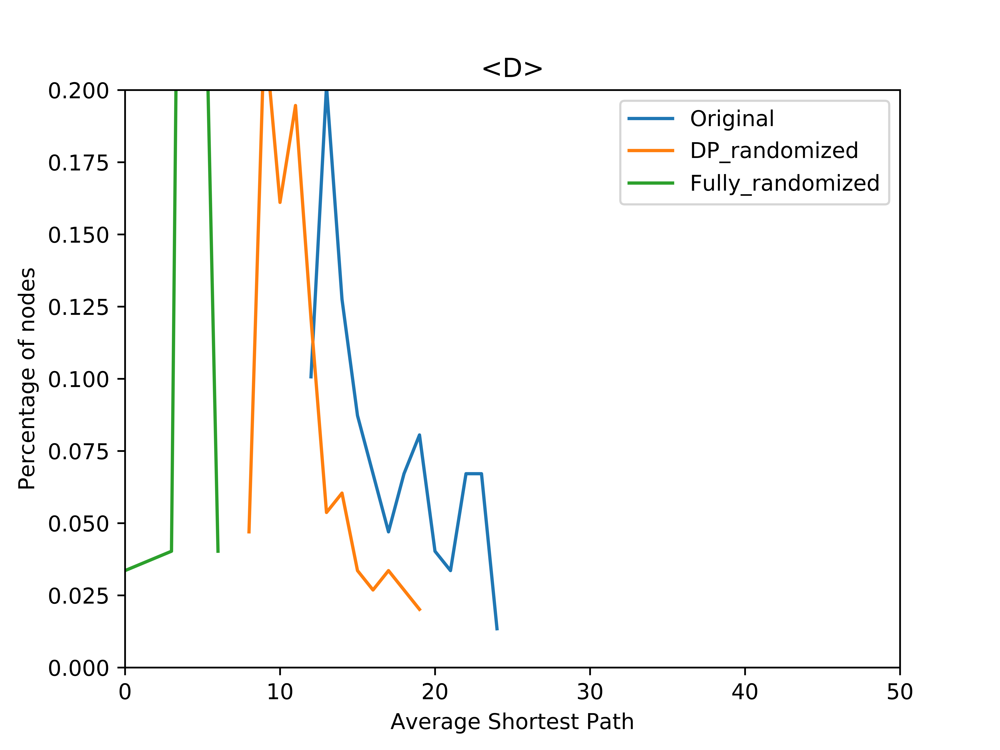

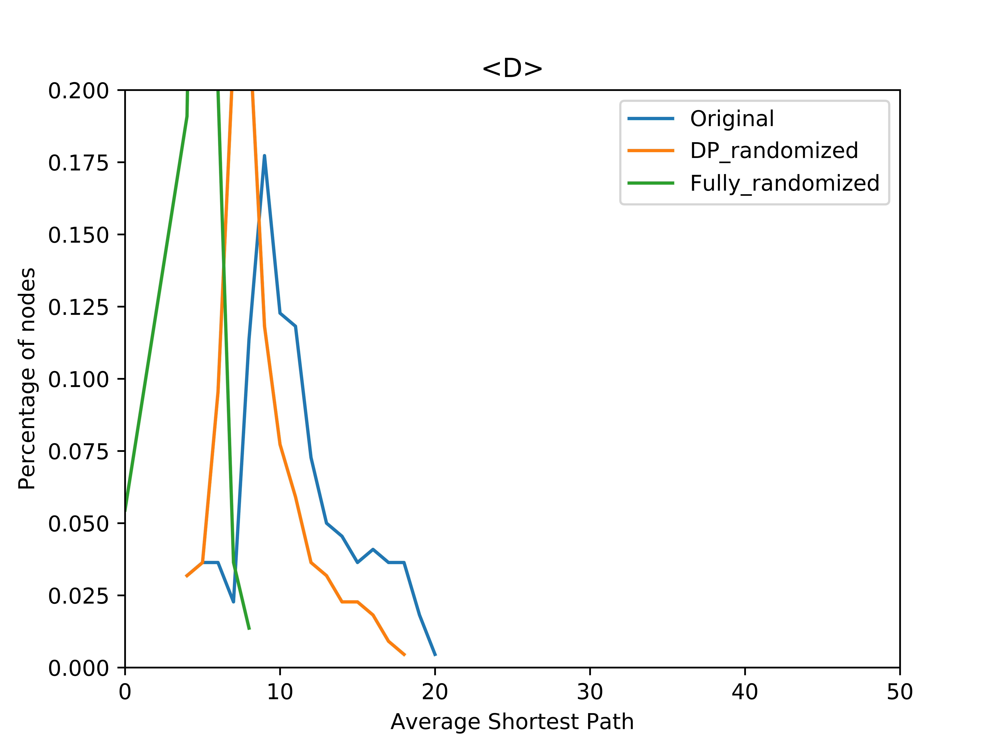

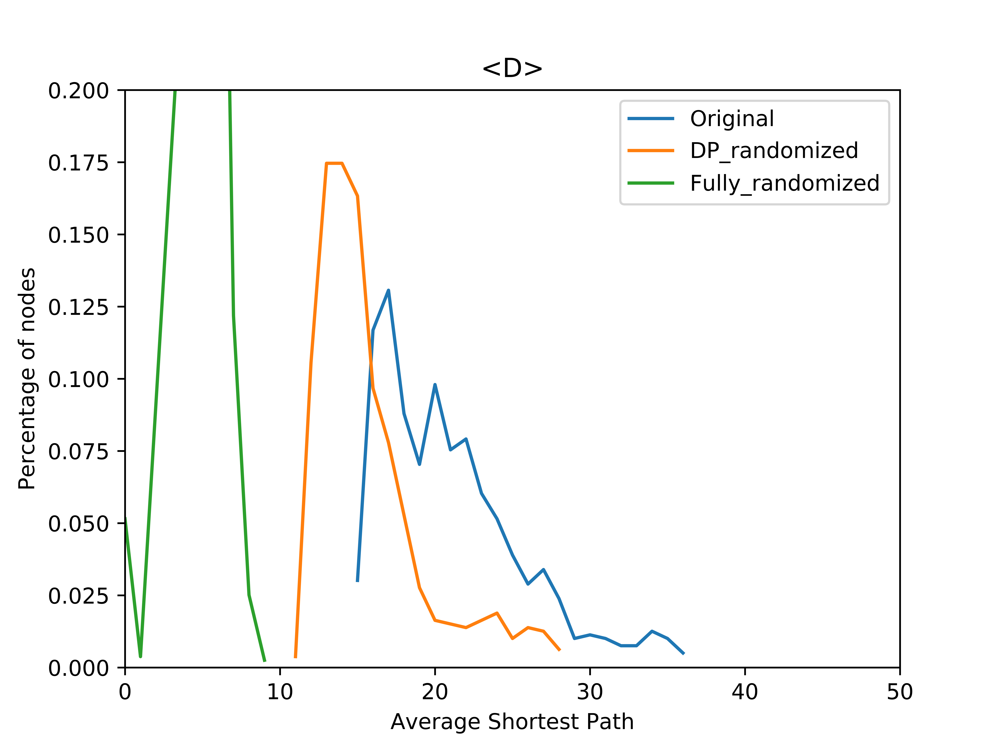

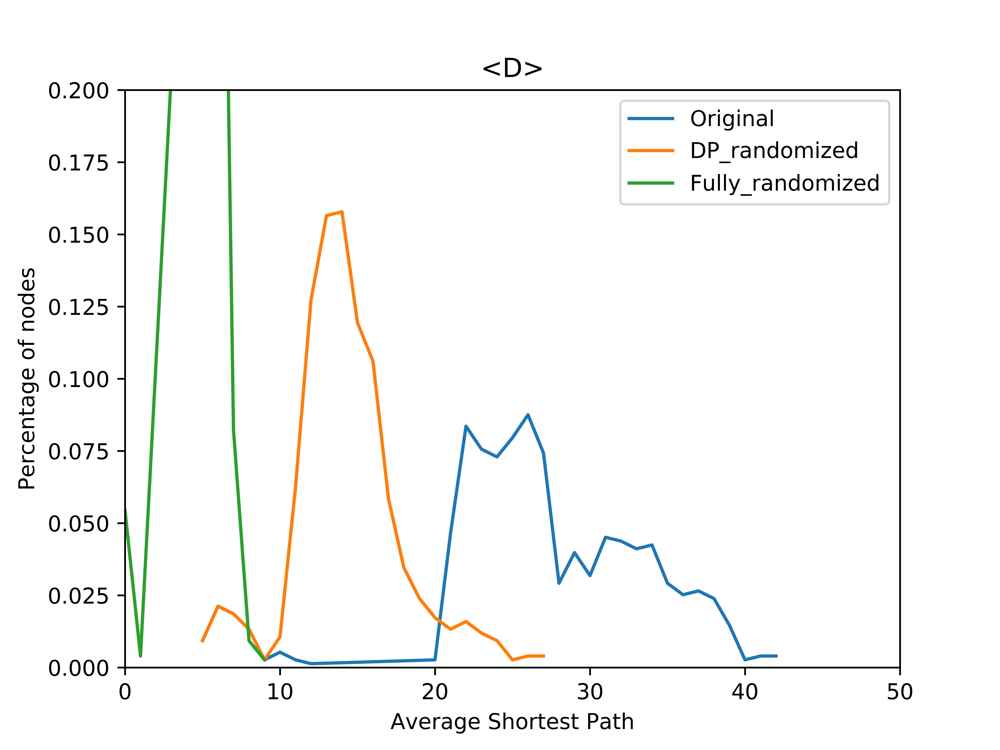

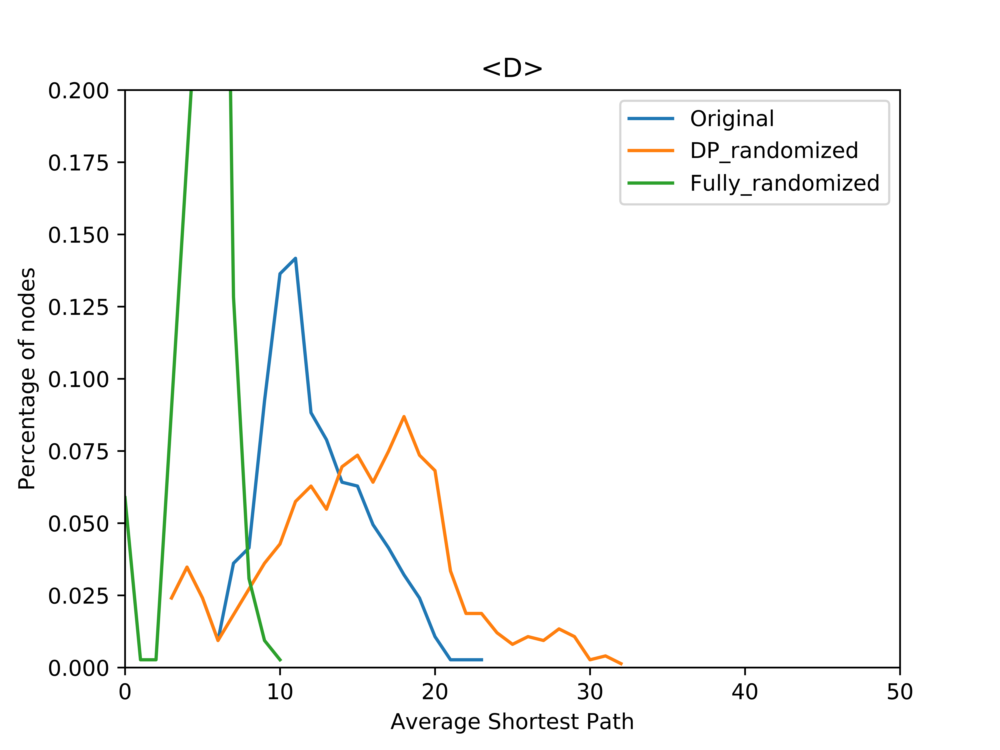

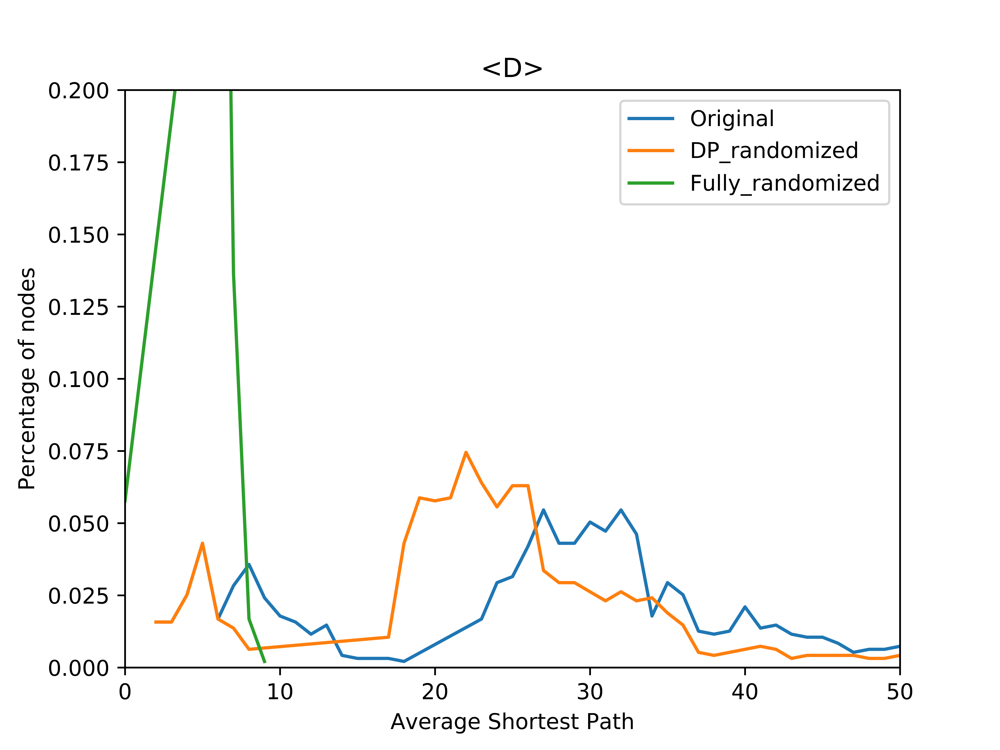

In [46]:
p1 = Image('./shortest_path/adjlist_ph1.txt.png', width=400)
p2 = Image('./shortest_path/adjlist_ph2.txt.png', width=400)
p3 = Image('./shortest_path/adjlist_ph3.txt.png', width=400)
p4 = Image('./shortest_path/adjlist_ph4.txt.png', width=400)
p5 = Image('./shortest_path/adjlist_ph5.txt.png', width=400)
p6 = Image('./shortest_path/adjlist_ph6.txt.png', width=400)
display(p1,p2,p3,p4,p5,p6)

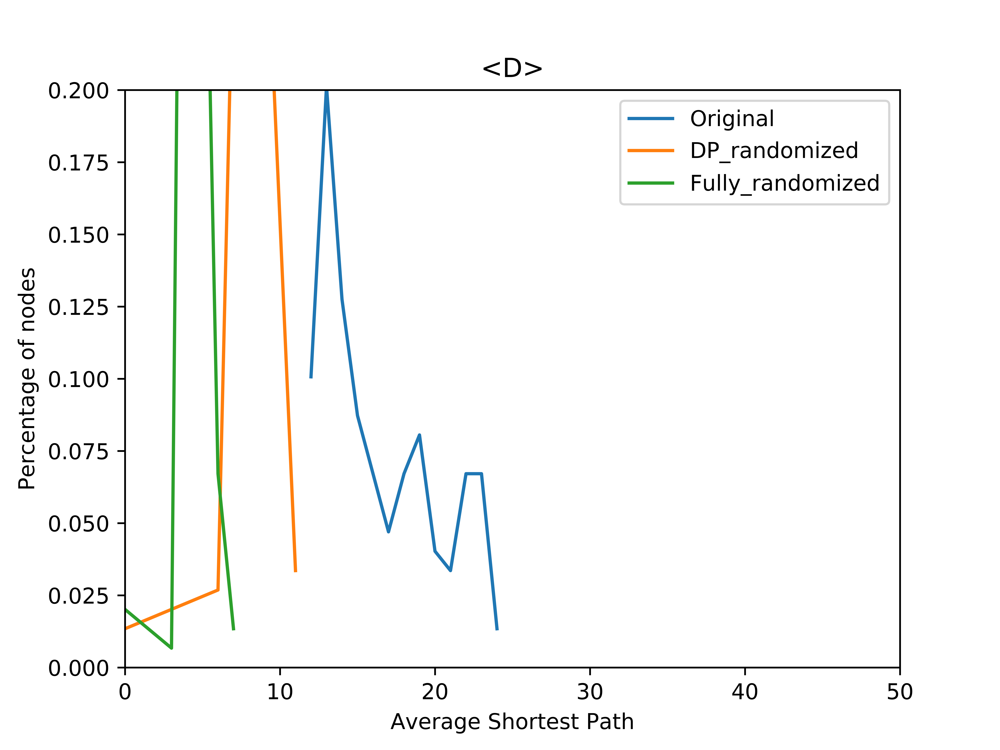

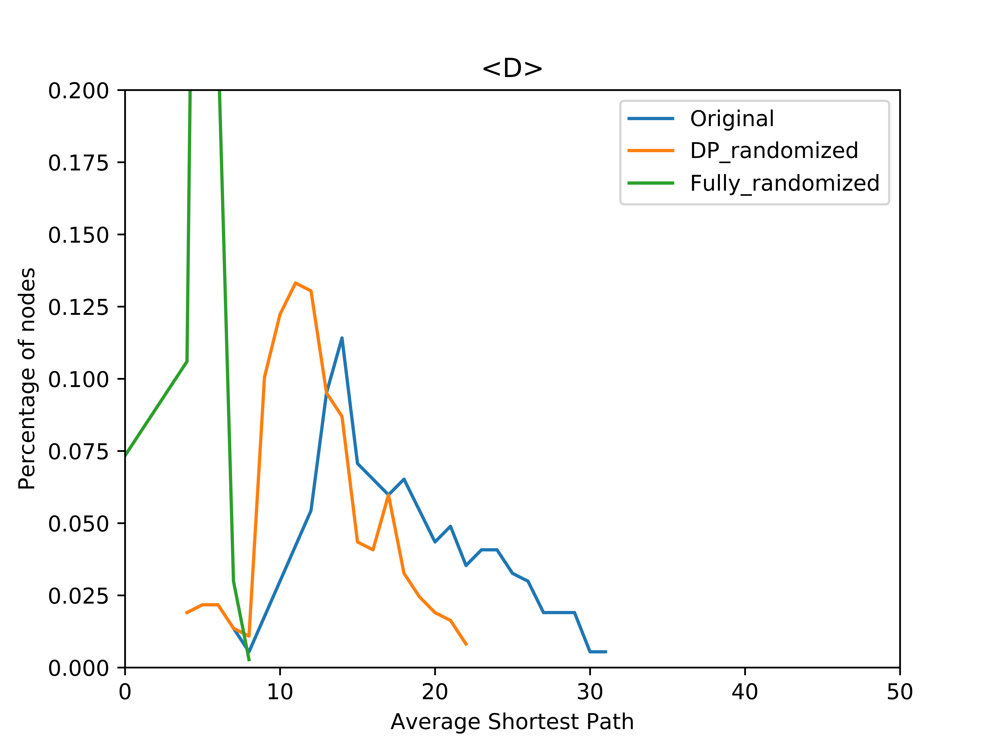

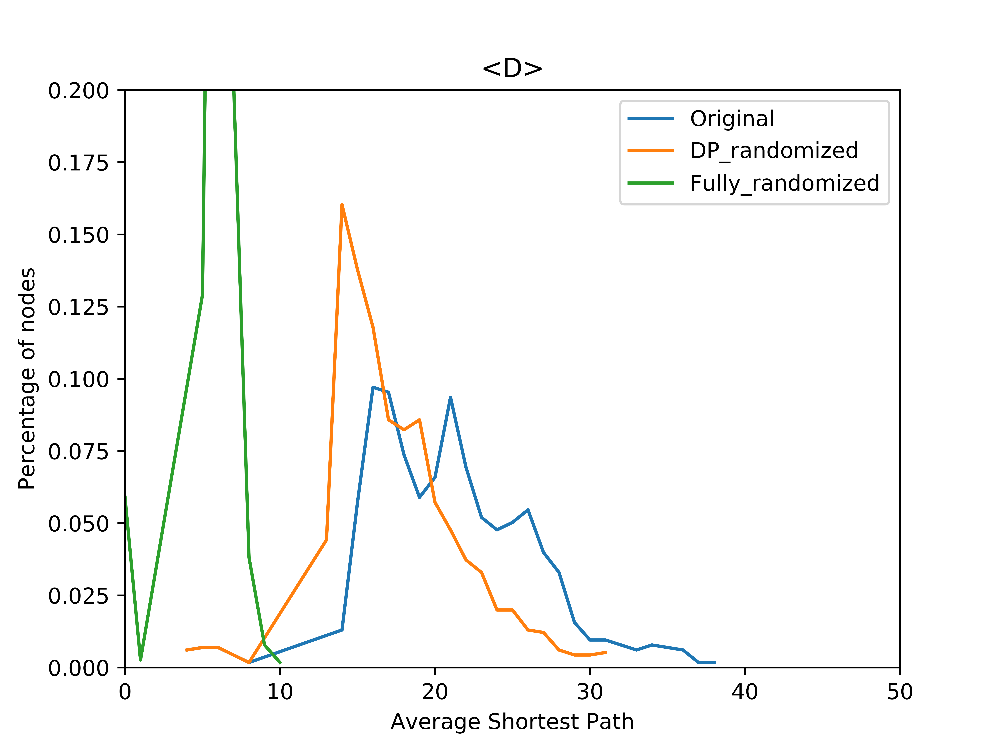

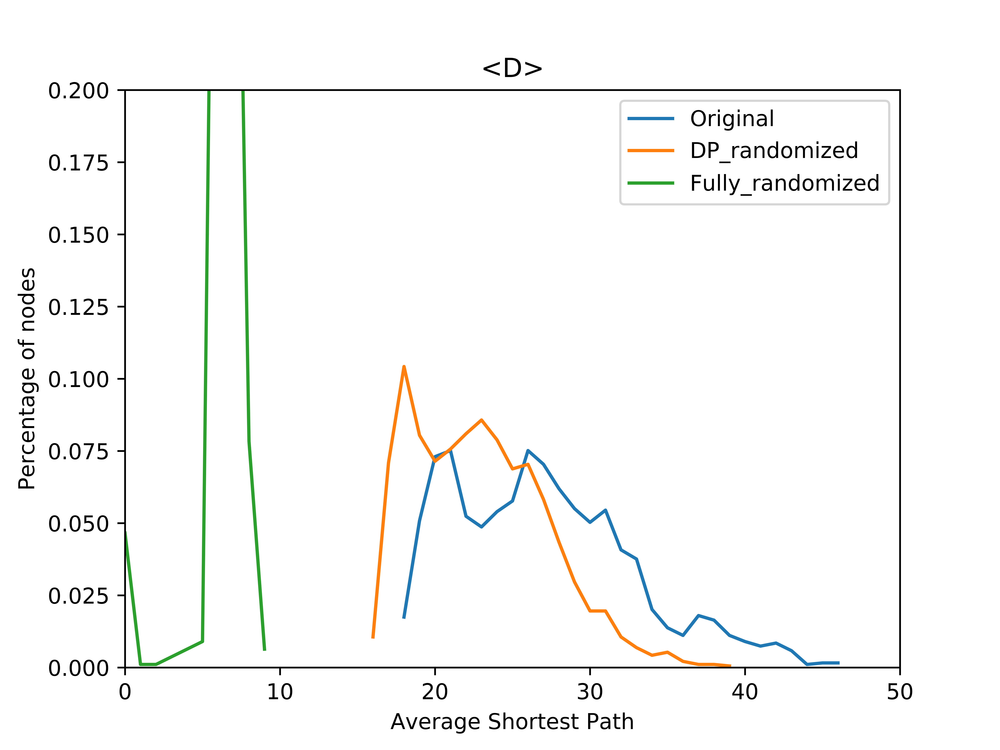

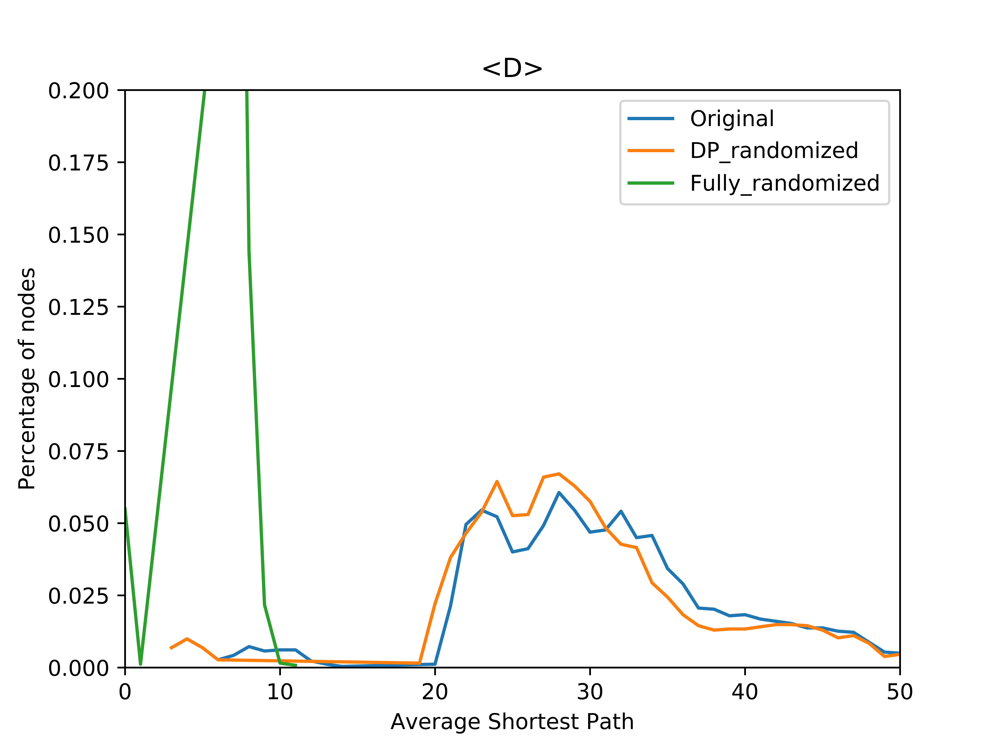

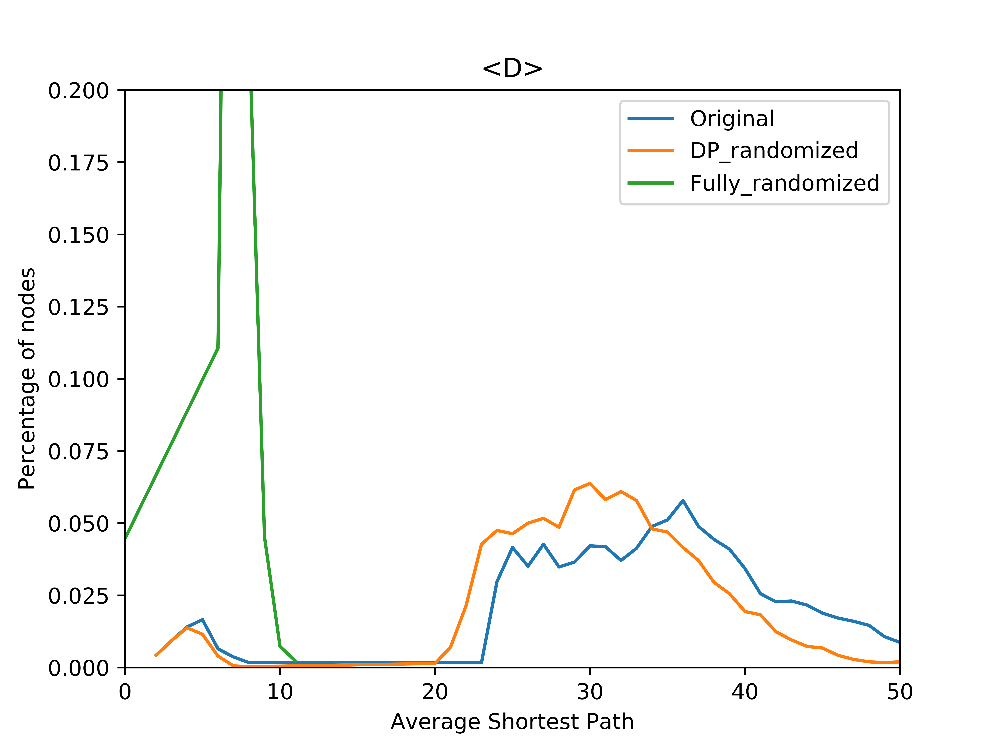

In [45]:
p1 = Image('./shortest_path/conc_adjlist_ph1.txt.png', width=400)
p2 = Image('./shortest_path/conc_adjlist_ph2.txt.png', width=400)
p3 = Image('./shortest_path/conc_adjlist_ph3.txt.png', width=400)
p4 = Image('./shortest_path/conc_adjlist_ph4.txt.png', width=400)
p5 = Image('./shortest_path/conc_adjlist_ph5.txt.png', width=400)
p6 = Image('./shortest_path/conc_adjlist_ph6.txt.png', width=400)
display(p1,p2,p3,p4,p5,p6)

### References 
  1) Petrov AS, Bernier CR, Hsiao C, Norris AM, et al. 2014. Evolution of the ribosome at atomic resolution. Proceedings of the National Academy of Sciences 111: 10251-6.
  
  2) Petrov AS, Gulen B, Norris AM, Kovacs NA, et al. 2015. History of the ribosome and the origin of translation. Proc Natl Acad Sci USA 112: 15396–401.
  
  3) Kovacs NA, Petrov AS, Lanier KA, Williams LD. 2017. Frozen in Time: The History of Proteins.Mol Biol Evol 34: 1252–60.
  
  4) Nepomnyachiy S, Ben-Tal N, Kolodny R. 2015. CyToStruct: Augmenting the Network Visualization of Cytoscape with the Power of Molecular Viewers. Structure 23: 941-8.
  
  5) Poirot O, Timsit Y. 2016. Neuron-Like Networks Between Ribosomal Proteins Within the Ribosome. Sci Rep 6: 26485. 
  
  6) Jubb, H. C., Higueruelo, A. P., Ochoa-Montaño, B., Pitt, W. R., Ascher, D. B., & Blundell, T. L. 2017. Arpeggio: A Web Server for Calculating and Visualising Interatomic Interactions in Protein Structures. Journal of Molecular Biology, 429: 365–71
  
  7) Piovesan D., Minervini G., Tosatto S.C.E. 2016. The RING 2.0 web server for high quality residue interaction networks. Nucleic Acids Research, 44: 367-74.
  
  8) Petrov, A.S., Bernier, C.R., Hershkovitz, E., Xue, Y., Waterbury, C.C., Grover, M.A., C., H.S., Hud, N.V., Wartell, R.M., and Williams, L.D. 2013. Secondary Structure and Domain Architecture of the 23S rRNA, Nucleic Acids Res. 41: 7522-35